# EDA of the King County House Sales Data Set

## Table of Contents <a Class="anchor" id="top"></a>

* ### [Variable Description](#variables)
* ### [Data Import and First Glance at the Data](#dataimport)
* ### [Types of Data and Missing Values](#typesofdata)
* ### [Had Some Houses Been Sold More Than Once?](#duplicates)
* ### [Basic Statistics and Correlation Matrix](#basicstats)
* ### [Adding new Features](#newfeatures)
* ### [Exploratory Data Analysis](#eda)
* ### [Multivariate Linear Regression](#mvlr)

# Variable Description <a class = "anchor" id = "variables"></a>

* **id** - unique identifier for a house
* **date** - Date the house was sold
* **price** -  Price the house was sold (prediction target)
* **bedrooms** -  Number of Bedrooms/House
* **bathrooms** -  Numberof bathrooms/bedrooms
* **sqft_living** -  square footage of the home
* **sqft_lot** -  square footage of the lot
* **floors** -  Total floors (levels) in house
* **waterfront** - House which has a view to a waterfront
* **view** - An index from 0 to 4 of how good the view of the property was
* **condition** - How good the overall condition is
* **grade** - overall grade given to the housing unit, based on King County grading system
* **sqft_above** - square footage of house apart from basement
* **sqft_basement** - square footage of the basement
* **yr_built** - Built Year
* **yr_renovated** - Year when house was renovated
* **zipcode** - zipcode
* **lat** - Latitude coordinate
* **long** - Longitude coordinate
* **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors
* **sqft_lot15** - The square footage of the land lots of the nearest 15 neighbors

# Import of all Python Packages <a class = "anchor" id = "packageimport"></a>

In [100]:
reset -fs

In [101]:
import datetime
import pandas as pd
import numpy as np
import seaborn as sns

import plotly.express as px
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn import metrics

%matplotlib widget

# Data Import and First Glance at the Data <a class = "anchor" id = "dataimport"></a>

In [102]:
houses = pd.read_csv("data/King_County_House_prices_dataset.csv")

In [103]:
data_size = houses.shape
print(data_size)

(21597, 21)


In [104]:
pd.set_option("display.max_columns", None)

In [6]:
houses.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
5,7237550310,5/12/2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,3,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930
6,1321400060,6/27/2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,3,7,1715,?,1995,0.0,98003,47.3097,-122.327,2238,6819
7,2008000270,1/15/2015,291850.0,3,1.50,1060,9711,1.0,0.0,NaN,3,7,1060,0.0,1963,0.0,98198,47.4095,-122.315,1650,9711
8,2414600126,4/15/2015,229500.0,3,1.00,1780,7470,1.0,0.0,0.0,3,7,1050,730.0,1960,0.0,98146,47.5123,-122.337,1780,8113
9,3793500160,3/12/2015,323000.0,3,2.50,1890,6560,2.0,0.0,0.0,3,7,1890,0.0,2003,0.0,98038,47.3684,-122.031,2390,7570


# Types of Data and Missing Values <a class = "anchor" id = "typesofdata"></a>

In [7]:
houses.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

The variables **waterfront, view and yr_renovated** have missing values.

The data type in **sqft_basement** column is object, which is suspicious, as one would expect them to be floats. Turns out they are actually stored as strings:

In [8]:
type(houses.sqft_basement[0])

str

In [105]:
try:
    houses.sqft_basement.astype(float)
except ValueError as e:
    print(e)

could not convert string to float: '?'


In [106]:
houses.sqft_basement.replace("?", np.nan, inplace=True)
houses.sqft_basement = houses.sqft_basement.astype(float)

In [107]:
nulls = pd.DataFrame(houses.isnull().sum(), columns=["n_nan"])
nulls["percentage"] = round(nulls.n_nan/houses.shape[0]*100, 1)
nulls[nulls.n_nan!=0]

,n_nan,percentage
waterfront,2376,11.0
view,63,0.3
sqft_basement,454,2.1
yr_renovated,3842,17.8


The variables **yr_renovated and waterfront** have a **substantial amount of missing values**.

## Had some houses been sold more than once? <a class = "anchor" id = "duplicates"></a>

In [109]:
data_size[0] - houses.id.nunique()

177

In [110]:
double_ids = []
ids = []

for i in houses.id:
    if i not in ids:
        ids.append(i)
    else:
        double_ids.append(i)
    
len(double_ids)

177

In [111]:
g = houses.copy()

d = g.loc[g['id'].isin(double_ids)]

d.sort_values(["id", "price"])

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
2494,1000102,9/16/2014,280000.0,6,3.00,2400,9373,2.0,NaN,0.0,3,7,2400,0.0,1991,0.0,98002,47.3262,-122.214,2060,7316
2495,1000102,4/22/2015,300000.0,6,3.00,2400,9373,2.0,0.0,0.0,3,7,2400,0.0,1991,0.0,98002,47.3262,-122.214,2060,7316
16800,7200179,10/16/2014,150000.0,2,1.00,840,12750,1.0,0.0,0.0,3,6,840,0.0,1925,0.0,98055,47.4840,-122.211,1480,6969
16801,7200179,4/24/2015,175000.0,2,1.00,840,12750,1.0,0.0,0.0,3,6,840,0.0,1925,NaN,98055,47.4840,-122.211,1480,6969
11421,109200390,8/20/2014,245000.0,3,1.75,1480,3900,1.0,0.0,0.0,4,7,1480,0.0,1980,0.0,98023,47.2977,-122.367,1830,6956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6340,9828200460,1/6/2015,430000.0,2,1.00,700,4800,1.0,0.0,0.0,3,7,700,0.0,1922,0.0,98122,47.6147,-122.300,1440,4800
15185,9834200305,7/16/2014,350000.0,3,1.00,1790,3876,1.5,0.0,0.0,5,7,1090,NaN,1904,0.0,98144,47.5750,-122.288,1360,4080
15186,9834200305,2/10/2015,615000.0,3,1.00,1790,3876,1.5,0.0,0.0,5,7,1090,700.0,1904,0.0,98144,47.5750,-122.288,1360,4080
1084,9834200885,7/17/2014,360000.0,4,2.50,2080,4080,1.0,0.0,0.0,5,7,1040,1040.0,1962,0.0,98144,47.5720,-122.290,1340,4080


# Basic Statistics and Correlation Matrix <a class = "anchor" id = "basicstats"></a>


In [112]:
houses.describe().round(2)

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,21597.00,21597.00,21597.00,21597.00,21597.00,21597.00,19221.00,21534.00,21597.00,21597.00,21597.00,21143.00,21597.00,17755.00,21597.00,21597.00,21597.00,21597.00,21597.00
mean,4.580474e+09,540296.57,3.37,2.12,2080.32,15099.41,1.49,0.01,0.23,3.41,7.66,1788.60,291.85,1971.00,83.64,98077.95,47.56,-122.21,1986.62,12758.28
std,2.876736e+09,367368.14,0.93,0.77,918.11,41412.64,0.54,0.09,0.77,0.65,1.17,827.76,442.50,29.38,399.95,53.51,0.14,0.14,685.23,27274.44
min,1.000102e+06,78000.00,1.00,0.50,370.00,520.00,1.00,0.00,0.00,1.00,3.00,370.00,0.00,1900.00,0.00,98001.00,47.16,-122.52,399.00,651.00
25%,2.123049e+09,322000.00,3.00,1.75,1430.00,5040.00,1.00,0.00,0.00,3.00,7.00,1190.00,0.00,1951.00,0.00,98033.00,47.47,-122.33,1490.00,5100.00
50%,3.904930e+09,450000.00,3.00,2.25,1910.00,7618.00,1.50,0.00,0.00,3.00,7.00,1560.00,0.00,1975.00,0.00,98065.00,47.57,-122.23,1840.00,7620.00
75%,7.308900e+09,645000.00,4.00,2.50,2550.00,10685.00,2.00,0.00,0.00,4.00,8.00,2210.00,560.00,1997.00,0.00,98118.00,47.68,-122.12,2360.00,10083.00
max,9.900000e+09,7700000.00,33.00,8.00,13540.00,1651359.00,3.50,1.00,4.00,5.00,13.00,9410.00,4820.00,2015.00,2015.00,98199.00,47.78,-121.32,6210.00,871200.00


In [17]:
houses_dum=houses.copy()

columns_to_drop = ["id", "date"]
for col in columns_to_drop:
    houses_dum.drop(col, axis=1, inplace=True)

mask = np.triu(houses_dum.corr())

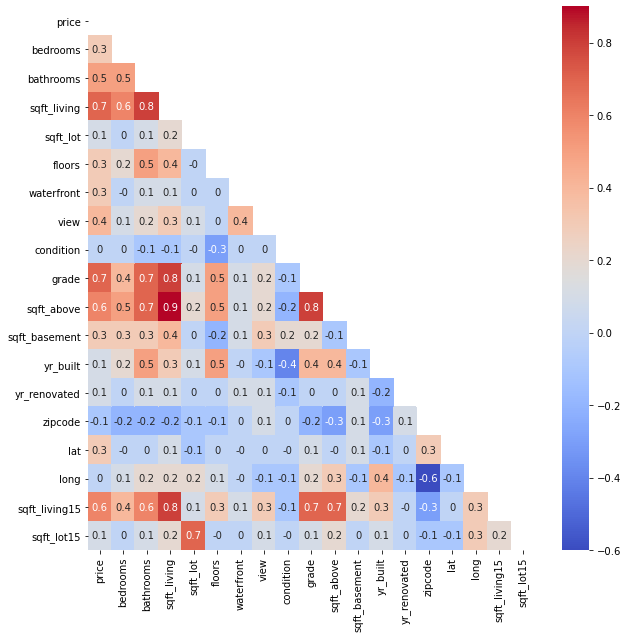

In [18]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(10,10))
ax = sns.heatmap(round(houses_dum.corr(), 1)
                 ,annot=True
                 ,mask=mask
                 ,cmap='coolwarm')


# Adding new features <a class = "anchor" id = "newfeatures"></a>

## Price per Sqft <a class = "anchor" id = "pricepersqft"></a>

In [113]:
houses.eval("price_per_sqft = price / sqft_living", inplace=True)

## Binning of Bedrooms and Bathrooms <a class = "anchor" id = "binningbb"></a>

In [20]:
houses["bathrooms_rounded"] = [np.ceil(b) for b in houses.bathrooms.values]

In [21]:
bins = [1, 2, 3, 4, 5, 6, 8, 34]
labels = ["1-2", "2-3", "3-4", "4-5", "5-6", "6-8", ">8"]

bedrooms_binned = pd.cut(houses.bedrooms, bins=bins, labels=labels)
bedrooms_binned.name = "bedrooms_binned"

houses["bedrooms_binned"] = bedrooms_binned

In [22]:
bins = [0, 1, 2, 3, 4, 9]
labels = ["0-1", "1-2", "2-3", "3-4", ">4"]

bathrooms_binned = pd.cut(houses.bathrooms, bins=bins, labels=labels)
bathrooms_binned.name = "bathrooms_binned"

houses["bathrooms_binned"] = bathrooms_binned

## sqft_living / bedrooms <a class = "anchor" id = "sqft/bedrooms"></a>

In [1]:
houses["sqft_per_bedrooms"] = houses.sqft_living / houses.bedrooms

NameError: name 'houses' is not defined

## bedrooms / bathrooms <a class = "anchor" id = "bedrooms/bathrooms"></a>

In [115]:
houses["bed_per_bath"] = houses.bedrooms / houses.bathrooms

# Exploratory Data Analysis (Figures) <a class = "anchor" id = "eda"></a>

## Histograms of Price and Price/Sqft <a class = "anchor" id = "histprice"></a>

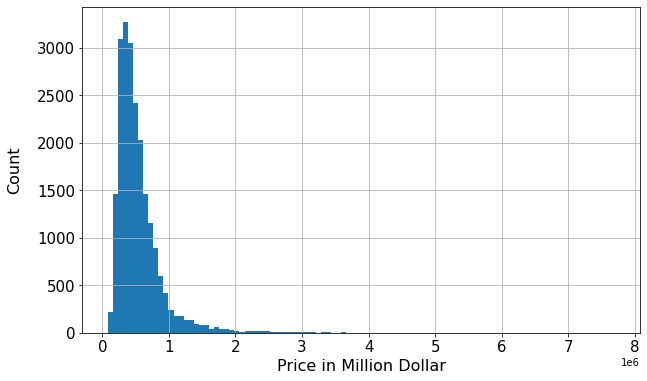

In [25]:
%matplotlib inline
fig, ax = plt. subplots(figsize=(10, 6))
houses.price.hist(bins=100)
plt.xlabel("Price in Million Dollar", fontdict={"fontsize":16})
plt.ylabel("Count", labelpad=15, fontdict={"fontsize":16})
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('figures/price_histogram.png');

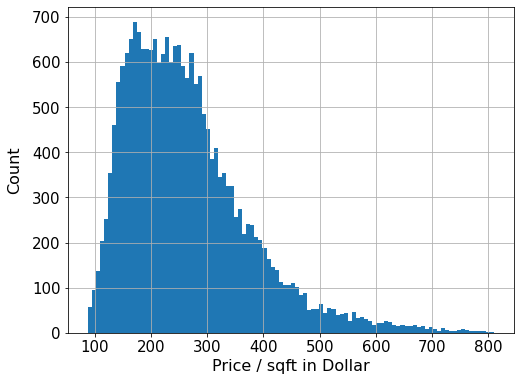

In [26]:
%matplotlib inline
fig, ax = plt. subplots(figsize=(8, 6))
houses.price_per_sqft.hist(bins=100)
plt.xlabel("Price / sqft in Dollar", fontdict={"fontsize":16})
plt.ylabel("Count", labelpad=10, fontdict={"fontsize":16})
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('figures/price_sqft_hist.png');

## Price/Sqft vs. Grade <a class = "anchor" id = "price_grade"></a>

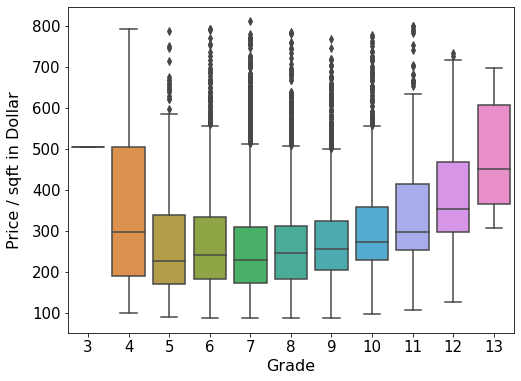

In [27]:
fig, ax = plt. subplots(figsize=(8, 6))
sns.boxplot(data=houses, x="grade", y="price_per_sqft", 
           # hue="grade"
           )
plt.xlabel("Grade", fontdict={"fontsize":16})
plt.ylabel("Price / sqft in Dollar", labelpad=10, 
           fontdict={"fontsize":16})
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('figures/price_grade.png');

## Sqft/Bedroom vs. Grade <a class = "anchor" id = "sqft_grade"></a>

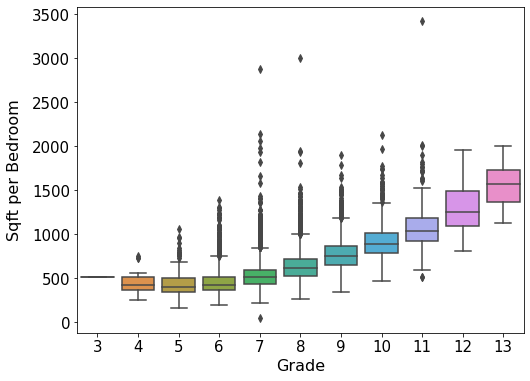

In [28]:
fig, ax = plt. subplots(figsize=(8, 6))
sns.boxplot(data=houses, x="grade", y="sqft_per_bedrooms")
plt.xlabel("Grade", fontdict={"fontsize":16})
plt.ylabel("Sqft per Bedroom", labelpad=10, 
           fontdict={"fontsize":16})
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('figures/sqft_bedroom_grade.png');

## Grade vs. Condition and View <a class = "anchor" id = "grade_view"></a>

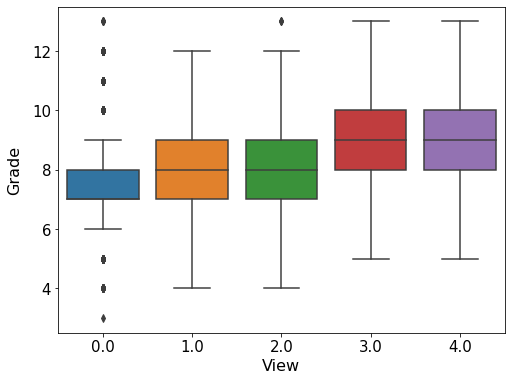

In [29]:
fig, ax = plt.subplots(figsize=(8, 6))
sns.boxplot(data=houses, x="view", y="grade")
plt.xlabel("View", fontdict={"fontsize":16})
plt.ylabel("Grade", labelpad=10, 
           fontdict={"fontsize":16})
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('figures/grade_view.png');

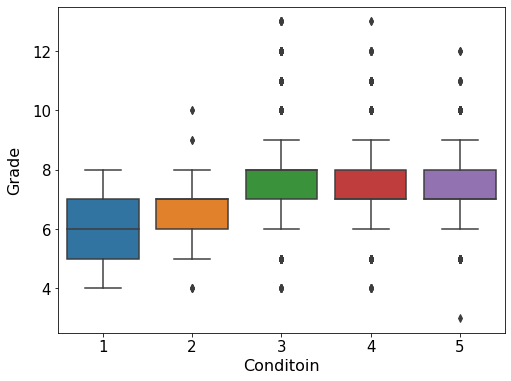

In [30]:
fig, ax = plt.subplots(figsize=(8, 6))
sns.boxplot(data=houses, x="condition", y="grade")
plt.xlabel("Conditoin", fontdict={"fontsize":16})
plt.ylabel("Grade", labelpad=10, 
           fontdict={"fontsize":16})
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('figures/grade_condition.png');

## Price/Sqft vs. Year Built <a class = "anchor" id = "price_year"></a>

In [31]:
bins = [i for i in range(1900, 2023, 10)]
labels = [i for i in range(12)]

yr_binned = pd.cut(houses.yr_built, bins=bins, labels=labels)
#houses_binned
yr_binned.name = "yr_binned"

houses = pd.concat([houses, yr_binned], axis=1)
houses.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_per_sqft,bathrooms_rounded,bedrooms_binned,bathrooms_binned,sqft_per_bedrooms,bed_per_bath,yr_binned
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,188.050847,1.0,2-3,0-1,393.333333,3.000000,5
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,209.338521,3.0,2-3,2-3,856.666667,1.333333,5
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062,233.766234,1.0,1-2,0-1,385.000000,2.000000,3
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,308.163265,3.0,3-4,2-3,490.000000,1.333333,6
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,303.571429,2.0,2-3,1-2,560.000000,1.500000,8


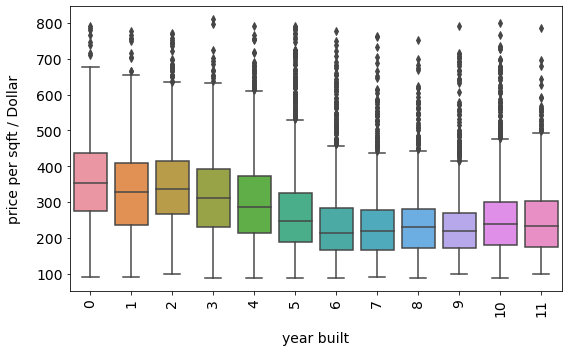

In [32]:
grouped = houses.groupby("yr_binned").median()

fig, ax = plt.subplots(figsize=(8,5))
sns.boxplot(x=houses["yr_binned"].values, y=houses.price_per_sqft.values, data=houses)
plt.xlabel("year built", labelpad=15, fontdict={"fontsize":14})
plt.ylabel("price per sqft / Dollar", labelpad=15, fontdict={"fontsize":14})
plt.xticks(fontsize=14, rotation=90)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.savefig("figures/price_year.png");

## City Map with Houses built in different time epoches <a class = "anchor" id = "citymap_year"></a>

In [33]:
houses.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'price_per_sqft',
       'bathrooms_rounded', 'bedrooms_binned', 'bathrooms_binned',
       'sqft_per_bedrooms', 'bed_per_bath', 'yr_binned'],
      dtype='object')

In [34]:
houses['year_bins'] = houses.yr_built.map(lambda x: 1 if x >= 1900 and x <= 1940
                            else (2 if x > 1940 and x <= 1980
                                 else 3))

In [35]:
lat1 = houses.loc[houses['year_bins'] == 1].lat
long1 = houses.loc[houses['year_bins'] == 1].long

lat2 = houses.loc[houses['year_bins'] == 2].lat
long2 = houses.loc[houses['year_bins'] == 2].long

lat3 = houses.loc[houses['year_bins'] == 3].lat
long3 = houses.loc[houses['year_bins'] == 3].long

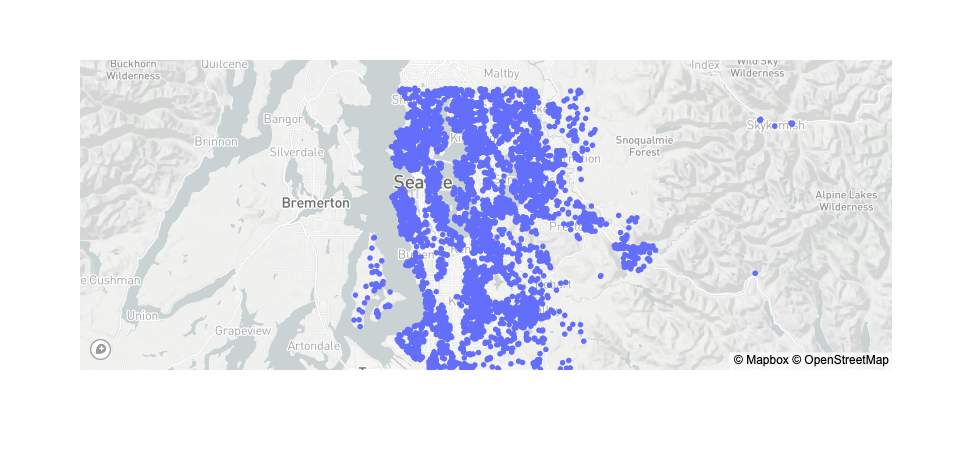

In [36]:
px.set_mapbox_access_token(open(".mapbox_token").read())

#fig = px.scatter_mapbox(houses, lat=lat2, lon=long2)
#fig = px.scatter_mapbox(houses, lat=lat1, lon=long1)
fig = px.scatter_mapbox(houses, lat=lat3, lon=long3)
               #         , 
               #         size="grade",
                        #color_continuous_scale=px.colors.cyclical.IceFire, 
                #        size_max=5, zoom=8, width=600, height=600)
fig.show()

## Price_per_sqft vs. View <a class = "anchor" id = "price_view"></a>

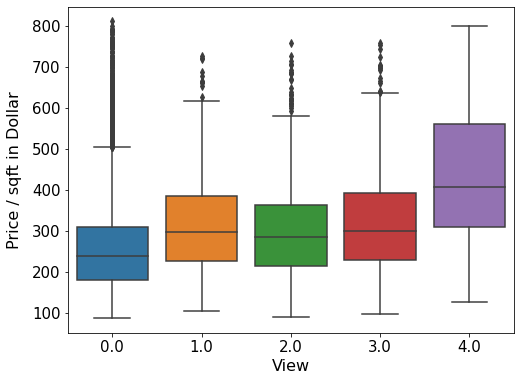

In [37]:
fig = plt.subplots(figsize=(8,6))
sns.boxplot(data=houses, x="view", y="price_per_sqft")
plt.xlabel("View", fontdict={"fontsize":16})
plt.ylabel("Price / sqft in Dollar", labelpad=10, 
           fontdict={"fontsize":16})
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('figures/price_view.png');

## Price/Sqft vs. Bedrooms and Bathrooms <a class = "anchor" id = "price_bedroom_bathroom"></a>

### Size of Dots: Sqft per Bedroom

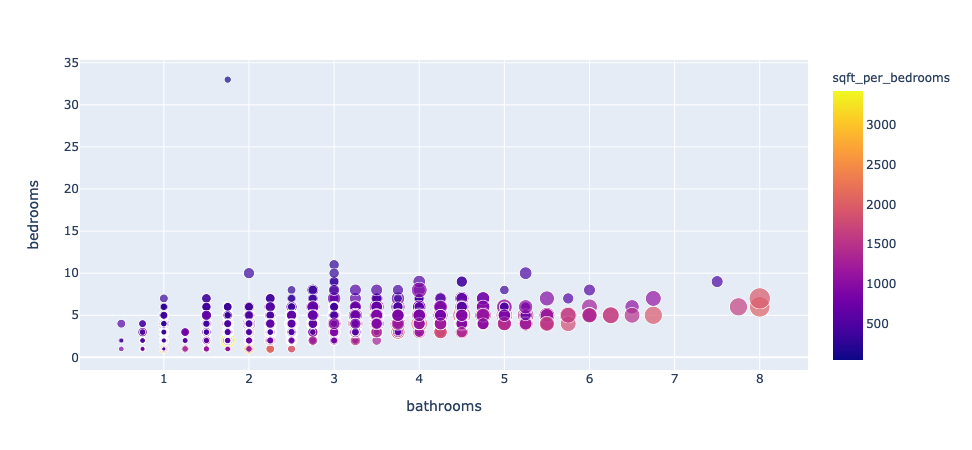

In [38]:
fig_scatter = px.scatter(houses, x = "bathrooms", y = "bedrooms", 
                         size = "sqft_living", 
                         color = "sqft_per_bedrooms",
                         hover_data = ["grade"],
                         size_max=15)
fig_scatter.show()

### Size of Dots: Sqft Living

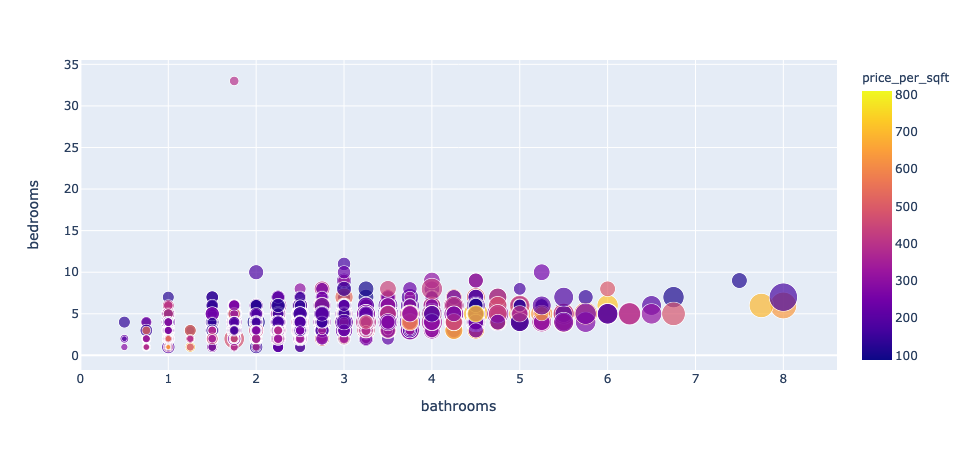

In [39]:
fig_scatter = px.scatter(houses, x = "bathrooms", y = "bedrooms", 
                         color = "price_per_sqft", 
                         size = "sqft_living",
                         hover_data = ["grade"])
fig_scatter.show()

## When is the best time of year to buy a house? <a class = "anchor" id = "besttime"></a>

In [40]:
e = houses.copy()


e["months"] = [float(d.split("/")[0]) for d in e.date]

months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", 
          "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

In [41]:
f = e.groupby("months").mean()
g = e.groupby("months").median()

f.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_per_sqft,bathrooms_rounded,sqft_per_bedrooms,bed_per_bath,year_bins
months,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,4.574031e+09,525963.251534,3.387526,2.129346,2085.094070,17869.721881,1.478528,0.008074,0.244856,3.347648,7.642127,1814.019427,273.845588,1971.749489,69.547419,98077.897751,47.553500,-122.212188,1975.859918,12687.026585,256.773212,2.448875,614.597851,1.761446,2.264826
2.0,4.599148e+09,508520.051323,3.347233,2.062550,2012.901363,13694.825180,1.466319,0.004541,0.242961,3.405774,7.558140,1727.935846,282.044299,1971.418605,57.380952,98076.716119,47.546850,-122.216140,1944.269447,11595.312751,259.770095,2.368885,603.101911,1.794726,2.264635
3.0,4.600587e+09,544057.683200,3.367467,2.065333,2021.968533,15604.088533,1.464267,0.006631,0.239957,3.355733,7.588267,1740.604800,281.828897,1970.597333,88.318567,98077.578667,47.553377,-122.214041,1951.490133,12678.426133,273.811231,2.382933,601.444916,1.802771,2.252800
4.0,4.692244e+09,562215.615074,3.367878,2.107896,2060.743831,14273.263795,1.495065,0.009036,0.229486,3.358905,7.651413,1777.883804,282.926773,1971.731270,66.504096,98078.967250,47.560614,-122.213484,1986.577389,12653.579632,278.835612,2.432481,613.759972,1.749679,2.280395
5.0,4.608945e+09,550849.746893,3.363712,2.116508,2090.514913,16678.293289,1.486123,0.005553,0.237126,3.420464,7.674399,1780.695940,309.463939,1970.216653,104.331827,98079.094863,47.565075,-122.214854,1990.449876,13694.719553,269.110846,2.435377,620.515163,1.745479,2.256007


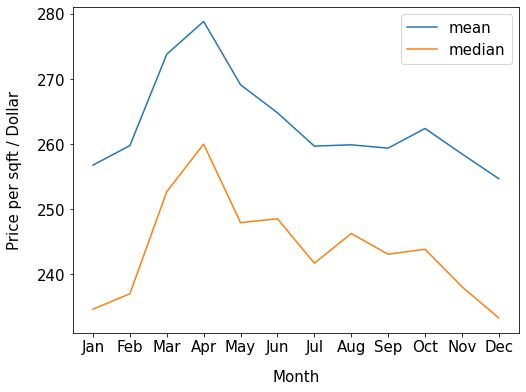

In [42]:
fig, ax = plt.subplots(figsize=(8, 6))
f.price_per_sqft.plot(label="mean")
g.price_per_sqft.plot(label="median")
plt.xlabel("Month", fontdict={"fontsize":15}, labelpad=15)
plt.xticks(range(1, 13), labels=months)
plt.ylabel("Price per sqft / Dollar", 
           labelpad=15, 
           fontdict={"fontsize":15})
plt.legend(fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.savefig("figures/price_month.png");

## Where are the rich neighborhoods? <a class = "anchor" id = "richneighbors"></a>

In [43]:
price_binned = pd.qcut(houses.price_per_sqft, q=5, labels=["{}".format(i) for i in range(5)])

price_binned.name = "price_quintile"

houses = pd.concat([houses, price_binned], axis=1)
houses.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_per_sqft,bathrooms_rounded,bedrooms_binned,bathrooms_binned,sqft_per_bedrooms,bed_per_bath,yr_binned,year_bins,price_quintile
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,188.050847,1.0,2-3,0-1,393.333333,3.000000,5,2,1
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,209.338521,3.0,2-3,2-3,856.666667,1.333333,5,2,1
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062,233.766234,1.0,1-2,0-1,385.000000,2.000000,3,1,2
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,308.163265,3.0,3-4,2-3,490.000000,1.333333,6,2,3
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,303.571429,2.0,2-3,1-2,560.000000,1.500000,8,3,3


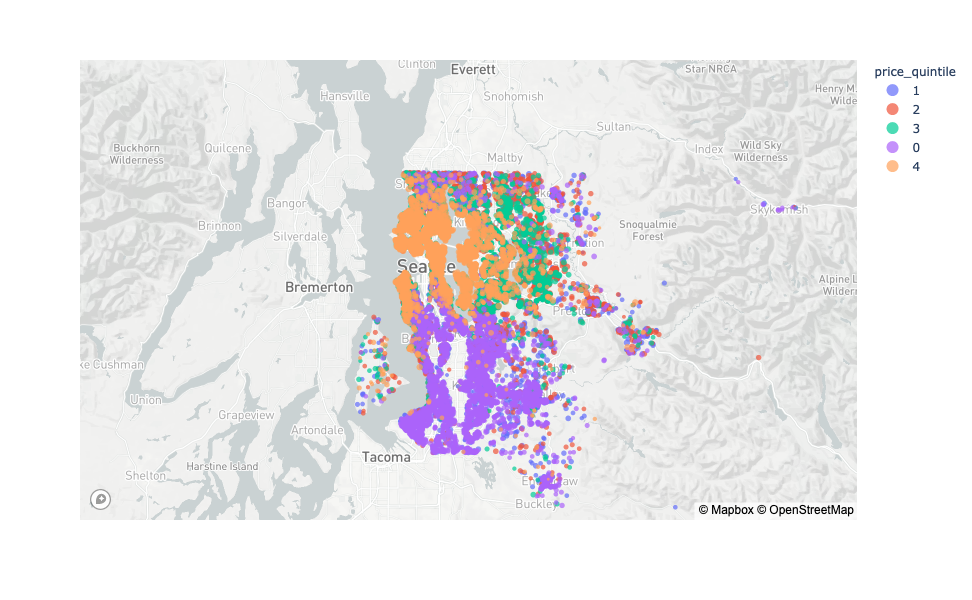

In [44]:
px.set_mapbox_access_token(open(".mapbox_token").read())

fig = px.scatter_mapbox(houses, lat="lat", lon="long", 
                        color="price_quintile", 
                        size="grade",
                        #color_continuous_scale=px.colors.cyclical.IceFire, 
                        size_max=5, zoom=8, width=600, height=600)
fig.show()

## City Map of Grades <a class = "anchor" id = "mapgrades"></a>

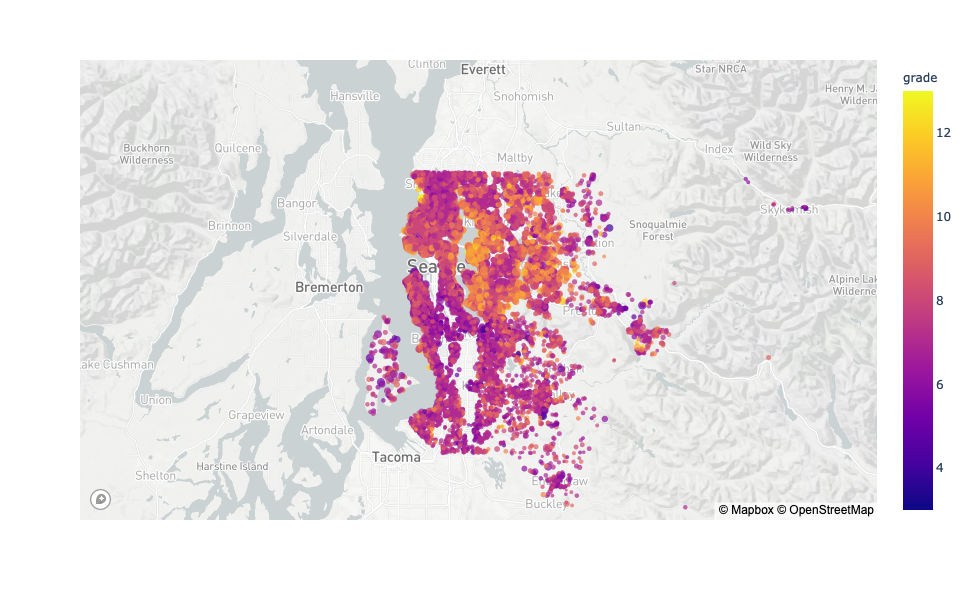

In [45]:
fig = px.scatter_mapbox(houses, lat="lat", lon="long", 
                        color="grade", 
                        size="price_per_sqft",
                        hover_data=["price", "view"],
                        #color_continuous_scale=px.colors.cyclical.IceFire, 
                        size_max=7, zoom=8, width=600, height=600)
fig.show()

# Multivariate Linear Regression <a class = "anchor" id = "mvlr"></a>

## Defininge the Mean Absolute Percentage Error <a class = "anchor" id = "mape"></a>

In [116]:
def mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true))

## Creating Copy of Dataframe and Dummy Columns for Categorical Variables <a class = "anchor" id = "copydummy"></a>

In [117]:
houses.dropna(how='any', subset=['view', 'waterfront'], inplace=True)

nulls = pd.DataFrame(houses.isnull().sum(), columns=["n_nan"])
nulls["percentage"] = round(nulls.n_nan/houses.shape[0]*100, 1)
nulls[nulls.n_nan!=0]

,n_nan,percentage
sqft_basement,415,2.2
yr_renovated,3402,17.8


In [118]:
lr = houses.copy()


In [121]:
drop = False
zip_dummies = pd.get_dummies(lr.zipcode, 
                             prefix='zip', 
                             drop_first=drop,
                             dtype=float)

yr_dummies = pd.get_dummies(lr.yr_built,
                            prefix='yr', 
                            drop_first=drop,
                            dtype=float)

view_dummies = pd.get_dummies(lr.view, 
                              prefix='view', 
                              drop_first=drop,
                              dtype=float)

grade_dummies = pd.get_dummies(lr.grade,
                               prefix='grade',
                               drop_first=drop,
                               dtype=float)

#bath_dummies = pd.get_dummies(lr.bathrooms,
#                              prefix="bath",
#                              drop_first=drop,
#                              dtype=int)#

#bed_dummies = pd.get_dummies(lr.bedrooms,
#                              prefix="bed",
#                              drop_first=drop,
#                              dtype=int)

In [122]:
lr = lr.drop(['zipcode', 'yr_built', 'view', 'grade', 'id', 'date', "yr_renovated"], axis=1)
            #  'bedrooms', 
            #  'bathrooms', 
            #  'sqft_lot'], axis=1

In [123]:
lr = pd.concat([lr, 
                zip_dummies, 
                yr_dummies, 
                view_dummies, 
                grade_dummies], axis=1)
            #    bath_dummies,
            #    bed_dummies

In [70]:
lr.head()

,price,sqft_living,floors,waterfront,condition,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,price_per_sqft,bathrooms_rounded,bedrooms_binned,bathrooms_binned,sqft_per_bedrooms,bed_per_bath,yr_binned,year_bins,price_quintile,zip_98001,zip_98002,zip_98003,zip_98004,zip_98005,zip_98006,zip_98007,zip_98008,zip_98010,zip_98011,zip_98014,zip_98019,zip_98022,zip_98023,zip_98024,zip_98027,zip_98028,zip_98029,zip_98030,zip_98031,zip_98032,zip_98033,zip_98034,zip_98038,zip_98039,zip_98040,zip_98042,zip_98045,zip_98052,zip_98053,zip_98055,zip_98056,zip_98058,zip_98059,zip_98065,zip_98070,zip_98072,zip_98074,zip_98075,zip_98077,zip_98092,zip_98102,zip_98103,zip_98105,zip_98106,zip_98107,zip_98108,zip_98109,zip_98112,zip_98115,zip_98116,zip_98117,zip_98118,zip_98119,zip_98122,zip_98125,zip_98126,zip_98133,zip_98136,zip_98144,zip_98146,zip_98148,zip_98155,zip_98166,zip_98168,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199,yr_1900,yr_1901,yr_1902,yr_1903,yr_1904,yr_1905,yr_1906,yr_1907,yr_1908,yr_1909,yr_1910,yr_1911,yr_1912,yr_1913,yr_1914,yr_1915,yr_1916,yr_1917,yr_1918,yr_1919,yr_1920,yr_1921,yr_1922,yr_1923,yr_1924,yr_1925,yr_1926,yr_1927,yr_1928,yr_1929,yr_1930,yr_1931,yr_1932,yr_1933,yr_1934,yr_1935,yr_1936,yr_1937,yr_1938,yr_1939,yr_1940,yr_1941,yr_1942,yr_1943,yr_1944,yr_1945,yr_1946,yr_1947,yr_1948,yr_1949,yr_1950,yr_1951,yr_1952,yr_1953,yr_1954,yr_1955,yr_1956,yr_1957,yr_1958,yr_1959,yr_1960,yr_1961,yr_1962,yr_1963,yr_1964,yr_1965,yr_1966,yr_1967,yr_1968,yr_1969,yr_1970,yr_1971,yr_1972,yr_1973,yr_1974,yr_1975,yr_1976,yr_1977,yr_1978,yr_1979,yr_1980,yr_1981,yr_1982,yr_1983,yr_1984,yr_1985,yr_1986,yr_1987,yr_1988,yr_1989,yr_1990,yr_1991,yr_1992,yr_1993,yr_1994,yr_1995,yr_1996,yr_1997,yr_1998,yr_1999,yr_2000,yr_2001,yr_2002,yr_2003,yr_2004,yr_2005,yr_2006,yr_2007,yr_2008,yr_2009,yr_2010,yr_2011,yr_2012,yr_2013,yr_2014,yr_2015,view_0.0,view_1.0,view_2.0,view_3.0,view_4.0,grade_3,grade_4,grade_5,grade_6,grade_7,grade_8,grade_9,grade_10,grade_11,grade_12,grade_13,bath_0.5,bath_0.75,bath_1.0,bath_1.25,bath_1.5,bath_1.75,bath_2.0,bath_2.25,bath_2.5,bath_2.75,bath_3.0,bath_3.25,bath_3.5,bath_3.75,bath_4.0,bath_4.25,bath_4.5,bath_4.75,bath_5.0,bath_5.25,bath_5.5,bath_5.75,bath_6.0,bath_6.25,bath_6.5,bath_6.75,bath_7.5,bath_7.75,bath_8.0,bed_1,bed_2,bed_3,bed_4,bed_5,bed_6,bed_7,bed_8,bed_9,bed_10,bed_11,bed_33
1,538000.0,2570,2.0,0.0,3,2170,400.0,47.7210,-122.319,1690,7639,209.338521,3.0,2-3,2-3,856.666667,1.333333,5,2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,180000.0,770,1.0,0.0,3,770,0.0,47.7379,-122.233,2720,8062,233.766234,1.0,1-2,0-1,385.000000,2.000000,3,1,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [246]:
regressors = ["sqft_living", 
              "bathrooms", 
              "bedrooms", 
             # "sqft_lot", 
              "waterfront", 
              "condition", 
             # "sqft_living15", 
             # "sqft_lot15", 
             # "floors"
             ]

for col in lr.columns:
    if col[:4] == "zip_":
        regressors.append(col)
    if col[:6] == "grade_":
        regressors.append(col)
    if col[:5] == "view_":
        regressors.append(col)
    if col[:3] == "yr_" and col != "yr_renovated":
        regressors.append(col)
#    if col[:4] == "bed_":
#        regressors.append(col)
#    if col[:5] == "bath_":
#        regressors.append(col)

207


## Split Dataset into Train and Test Sets and Perform Fit <a class = "anchor" id = "splitandfit"></a>

In [247]:
train, test = train_test_split(lr, train_size = 0.8)
model = linear_model.LinearRegression()
model.fit(train[regressors], train["price"])

LinearRegression()

In [248]:
print(model.score(train[regressors], train['price']),
    model.score(test[regressors], test['price']))

0.8373671664927707 0.8264272500492966


In [249]:
predicted_values_train = model.predict(train[regressors])
mape(train["price"], predicted_values_train)

0.17229497126654905

In [250]:
predicted_values_test = model.predict(test[regressors])
mape(test["price"], predicted_values_test)

0.17362505942631584

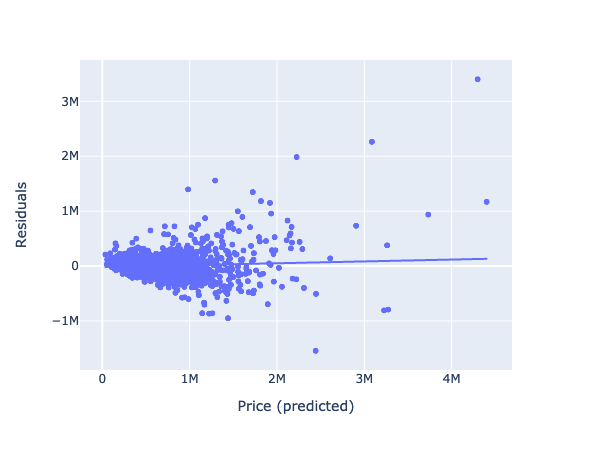

In [251]:
fig_scatter = px.scatter(x = predicted_values_test, y = test["price"]-predicted_values_test, trendline = "ols", 
                         labels = {"x": "Price (predicted)", "y": "Residuals"}, size_max=1
                      #   color = "price_per_sqft", 
                      #   size = "sqft_living",
                      #   hover_data = ["grade"]
                        )
fig_scatter.show()

## Fit Logarithm of the price

In [93]:
lr = houses.copy()

In [94]:
lr["log_price"] = np.log(lr.price)

In [95]:
drop = True
zip_dummies = pd.get_dummies(lr.zipcode, 
                             prefix='zip', 
                             drop_first=drop,
                             dtype=float)

yr_dummies = pd.get_dummies(lr.yr_built,
                            prefix='yr', 
                            drop_first=drop,
                            dtype=float)

view_dummies = pd.get_dummies(lr.view, 
                              prefix='view', 
                              drop_first=drop,
                              dtype=float)

grade_dummies = pd.get_dummies(lr.grade,
                               prefix='grade',
                               drop_first=drop,
                               dtype=float)

In [96]:
lr = lr.drop(['zipcode', 'yr_built', 'view', 'grade', 'id', 'date',
              'bedrooms', 
          #    'bathrooms', 
              'sqft_lot'], axis=1)

In [97]:
lr = pd.concat([lr, zip_dummies, yr_dummies, 
                view_dummies, 
                grade_dummies],
               axis=1)

In [98]:
regressors = ["sqft_living"]

for col in lr.columns:
    if col[:4] == "zip_":
        regressors.append(col)
    if col[:6] == "grade_":
        regressors.append(col)
    if col[:5] == "view_":
        regressors.append(col)
    if col[:3] == "yr_" and col != "yr_renovated":
        regressors.append(col)
        
print(len(regressors))

200


In [99]:
train, test = train_test_split(lr, train_size = 0.8)
model = linear_model.LinearRegression()
model.fit(train[regressors], train["log_price"])

print(model.score(train[regressors], train['log_price']),
    model.score(test[regressors], test['log_price']))

predicted_values_train = model.predict(train[regressors])
print(mape(train["log_price"], predicted_values_train))

predicted_values_test = model.predict(test[regressors])
print(mape(test["log_price"], predicted_values_test))

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [ ]:
fig_scatter = px.scatter(x = predicted_values_test, y =test["log_price"]-predicted_values_test, trendline = "ols", 
                         labels = {"x": "Price", "y": "Residuals"}, size_max=1
                      #   color = "price_per_sqft", 
                      #   size = "sqft_living",
                      #   hover_data = ["grade"]
                        )
fig_scatter.show()